In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import harmonypy
import pymn
import scrublet as scr
import gseapy as gp
from gseapy.plot import barplot, dotplot
import bottleneck
import pyreadr
from scipy.io import mmread
import scipy
from sklearn import preprocessing
import random as rd
import scib
from matplotlib_venn import venn2,venn2_circles,venn3
from pyscenic.export import export2loom, add_scenic_metadata
from sklearn.decomposition import NMF
from sklearn import metrics
import palettable
from pyscenic.rss import regulon_specificity_scores
import matplotlib.image as mpimg
from scipy import stats
from sklearn import metrics
import palettable

/public/home/guogjgroup/ggj/anaconda3/lib/python3.9/site-packages/pyMetaNeighbor-0.1.0-py3.9.egg/pymn/trainModel.py:29: SyntaxWarning: "is not" with a literal. Did you mean "!="?
/public/home/guogjgroup/ggj/anaconda3/lib/python3.9/site-packages/pyMetaNeighbor-0.1.0-py3.9.egg/pymn/trainModel.py:29: SyntaxWarning: "is not" with a literal. Did you mean "!="?
Error: package or namespace load failed for 'methods' in dyn.load(file, DLLpath = DLLpath, ...):
 unable to load shared object '/public/home/guogjgroup/ggj/anaconda3/envs/R3.6/lib/R/library/methods/libs/methods.so':
  libR.so: cannot open shared object file: No such file or directory
During startup - Warning messages:
1: package 'methods' was built under R version 3.6.3 
2: package "methods" in options("defaultPackages") was not found 
3: package 'datasets' was built under R version 3.6.3 
4: package 'grDevices' was built under R version 3.6.3 
5: package 'graphics' was built under R version 3.6.3 
6: package 'methods' was built under

In [2]:
sc.set_figure_params(dpi = 200, color_map = 'viridis_r' )
sc.settings.verbosity = 2

/public/home/guogjgroup/ggj/anaconda3/lib/python3.9/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


In [3]:
def type_composition(adata_used, clustering_used, type_displayed):
    
    cluster_stat_all = pd.DataFrame()

    for each_tissue in np.unique(adata_used.obs[type_displayed]).tolist():

        each_tissue_stat = pd.DataFrame(adata_used[adata_used.obs[type_displayed] == each_tissue].obs[clustering_used].value_counts())
        each_tissue_stat.columns = [each_tissue]
        cluster_stat_all = pd.concat([each_tissue_stat, cluster_stat_all], axis = 1)

    cluster_stat_all = cluster_stat_all.fillna(0)
    column_list = cluster_stat_all.columns.tolist()
    cluster_stat_all['all_cell'] = cluster_stat_all.sum(axis=1)

    for i in column_list:

        cluster_stat_all[i] = cluster_stat_all[i]/cluster_stat_all['all_cell']

    del cluster_stat_all['all_cell']

    cluster_stat_all['cluster'] = cluster_stat_all.index
    #cluster_stat_all['cluster'] = cluster_stat_all['cluster'].astype(int)
    cluster_stat_all = cluster_stat_all.sort_values('cluster')

    del cluster_stat_all['cluster']

    with plt.rc_context({"figure.figsize": (16, 3), "figure.dpi": (200)}):
        cluster_stat_all.plot(kind = 'bar', stacked = True)
        plt.grid(False)
    #        plt.axis('off')
        plt.legend(bbox_to_anchor=(1.0, 1.0))

# Reesults Display

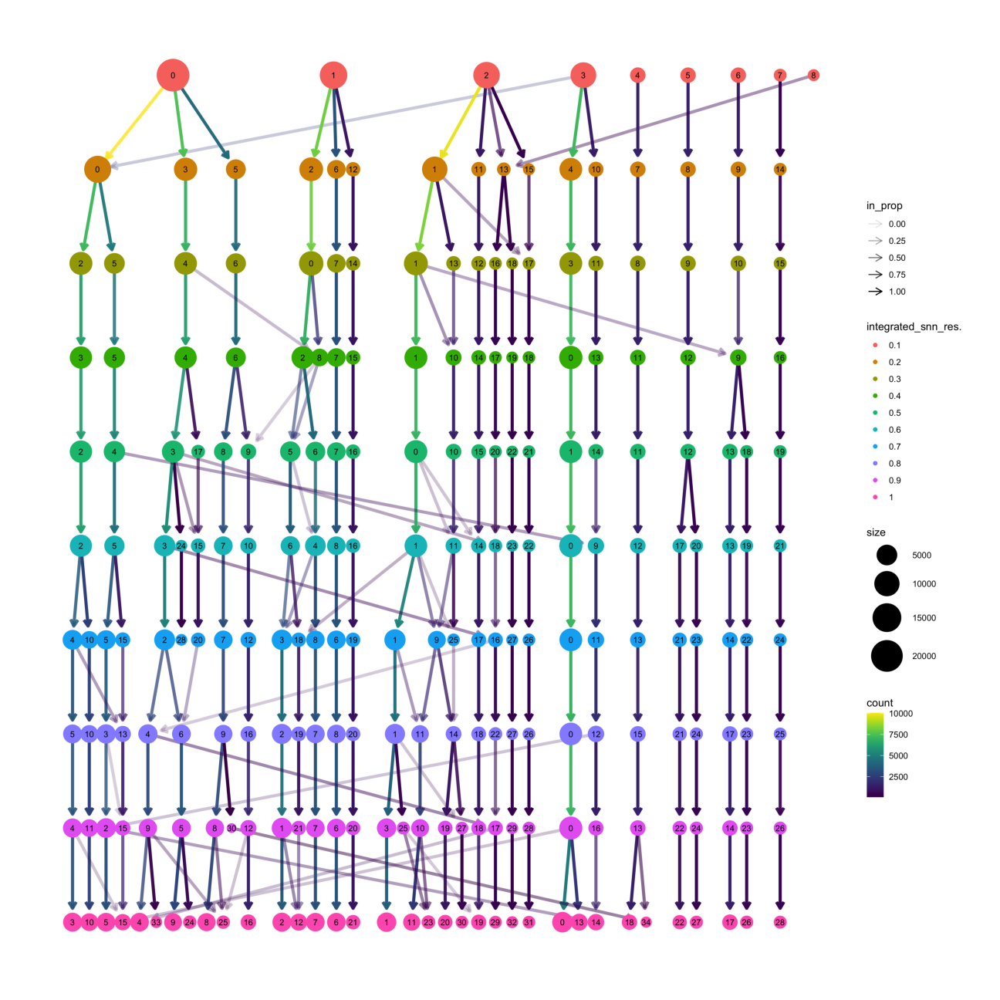

In [11]:
plt.imshow(mpimg.imread("adata_for_seurat_monocyte_no_AML_sct_cluster_multiple_res_clustree.png"))
plt.grid(False)
plt.axis('off')
plt.show()

# Annotation: Resolution = 0.5

In [15]:
adata = sc.read('/public/home/guogjgroup/ggj/matq_analysis/pan_cancer/all_cell/adata_all_cell_raw_with_anno_latest.h5ad')
adata_res = sc.read('adata_all_monocyte_sct_marker.h5ad')

adata = adata[adata_res.obs.index.tolist(), :]

adata.obs['leiden'] = adata_res.obs['res_0.5']
adata.uns['all_cell_marker'] = adata_res.uns['res_0.5_marker']

adata_graph = sc.read('adata_for_seurat_monocyte_no_AML_sct.h5ad')
adata = adata[adata_graph.obs.index.tolist(), :]

adata.obsm['X_umap'] = adata_graph.obsm['X_umap']
adata.obsm['X_pca'] = adata_graph.obsm['X_pca']

adata.write('adata_all_monocyte_sct_annotation_latest.h5ad')

/tmp/ipykernel_15038/574111609.py:6: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['leiden'] = adata_res.obs['res_0.5']


In [33]:
clustering_used = 'leiden'

anno_df = adata.obs[[clustering_used]].copy()

anno_df[clustering_used].replace('0', 'TAM_PTPRF high', inplace=True)

anno_df[clustering_used].replace('1', 'TAM_FN1 high', inplace=True)

anno_df[clustering_used].replace('2', 'TAM_GPNMB high', inplace=True)

anno_df[clustering_used].replace('3', 'TAM_CD163 high', inplace=True)

anno_df[clustering_used].replace('4', 'TAM_PLAUR high', inplace=True)
    
anno_df[clustering_used].replace('5', 'MT high TAM', inplace=True)

anno_df[clustering_used].replace('6', 'TAM_PELI1 high', inplace=True)

anno_df[clustering_used].replace('7', 'TAM_MDM2 high', inplace=True)

anno_df[clustering_used].replace('8', 'TAM_PREX1 high', inplace=True)

anno_df[clustering_used].replace('9', 'TAM_XYLT1 high', inplace=True)

anno_df[clustering_used].replace('10', 'TAM_PTPRN2 high', inplace=True)

anno_df[clustering_used].replace('11', 'TAM_CD247 high', inplace=True)

anno_df[clustering_used].replace('12', 'ECM high TAM', inplace=True)

anno_df[clustering_used].replace('13', 'Cell cycle TAM_CIT high', inplace=True)

anno_df[clustering_used].replace('14', 'TAM_ABR high', inplace=True)

anno_df[clustering_used].replace('15', 'TAM_ANK3 high', inplace=True)

anno_df[clustering_used].replace('16', 'TAM_PDE4B high', inplace=True)

anno_df[clustering_used].replace('17', 'TAM_RBPJ high', inplace=True)

anno_df[clustering_used].replace('18', 'Cell cycle TAM_C2orf48 high', inplace=True)

anno_df[clustering_used].replace('19', 'DC', inplace=True)

anno_df[clustering_used].replace('20', 'TAM_WWC1 high', inplace=True)

anno_df[clustering_used].replace('21', 'TAM_MAGI1 high', inplace=True)

anno_df[clustering_used].replace('22', 'TAM_NUB1 high', inplace=True)

anno_df['anno'] = anno_df[clustering_used].astype(str)

anno_df = anno_df.loc[adata.obs.index.tolist(), :]
adata.obs['anno'] = anno_df['anno'].copy()
adata.obs['anno'] = adata.obs['anno'].astype(str)

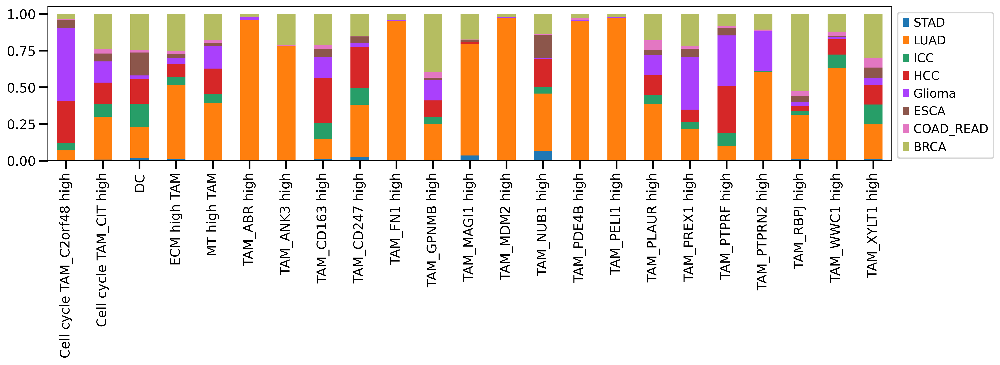

In [40]:
type_composition(adata, 'anno', 'cancer_type')
plt.savefig('figures/type_composition_cancer_type.pdf')

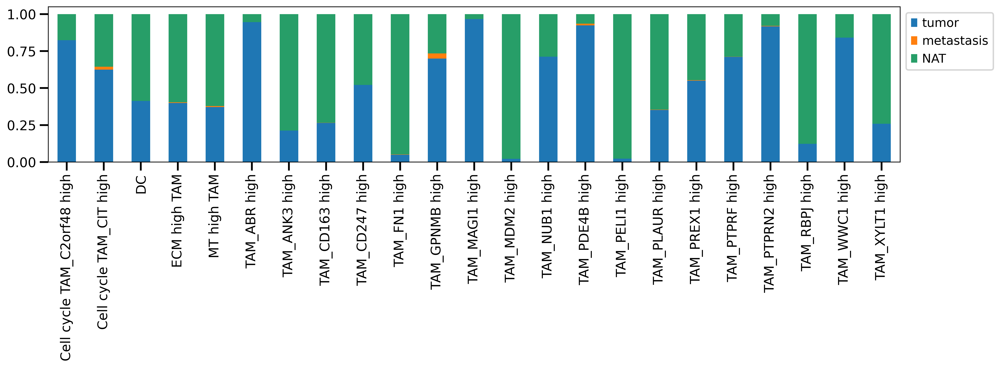

In [41]:
adata.obs['tissue'] = adata.obs['sample'].str.split('_', expand=True)[2]
type_composition(adata, 'anno', 'tissue')
plt.savefig('figures/type_composition_tissue.pdf')

In [42]:
adata_raw = sc.read('adata_all_monocyte_sct_annotation_latest.h5ad')
adata_raw = adata_raw[adata.obs.index.tolist(), :]
adata_raw.obs['tissue'] = adata_raw.obs['sample'].str.split('_', expand=True)[2]
adata_raw.obs['anno'] = adata.obs['anno']
adata_raw.write('adata_all_monocyte_sct_annotation_latest.h5ad')

/tmp/ipykernel_31675/984554052.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_raw.obs['tissue'] = adata_raw.obs['sample'].str.split('_', expand=True)[2]


In [44]:
all_marker_df_sorted = pd.read_csv('monocyte_marker_each_cancer_stat_sorted.csv')
leiden2anno = adata.obs[['leiden', 'anno']].copy()
leiden2anno.drop_duplicates(keep='first',inplace=True)

leiden2anno['leiden'] = leiden2anno['leiden'].astype(str)
all_marker_df_sorted['cluster'] = all_marker_df_sorted['cluster'].astype(str)

leiden2anno.index = leiden2anno['leiden']
del leiden2anno['leiden']

for i in all_marker_df_sorted.index.tolist():
    
    all_marker_df_sorted.loc[i, 'anno'] = leiden2anno.loc[all_marker_df_sorted.loc[i, 'cluster'], 'anno']
    
all_marker_df_sorted.to_csv('monocyte_marker_each_cancer_stat_sorted.csv', index=None)    

In [46]:
len(np.unique(adata.obs['leiden']).tolist())

23

In [47]:
len(np.unique(adata.obs['anno']).tolist())

23

In [48]:
all_marker_df_sorted = pd.read_csv('monocyte_marker_each_cancer.csv')
leiden2anno = adata.obs[['leiden', 'anno']].copy()
leiden2anno.drop_duplicates(keep='first',inplace=True)

leiden2anno['leiden'] = leiden2anno['leiden'].astype(str)
all_marker_df_sorted['cluster'] = all_marker_df_sorted['cluster'].astype(str)

leiden2anno.index = leiden2anno['leiden']
del leiden2anno['leiden']

for i in all_marker_df_sorted.index.tolist():
    
    all_marker_df_sorted.loc[i, 'anno'] = leiden2anno.loc[all_marker_df_sorted.loc[i, 'cluster'], 'anno']
    
all_marker_df_sorted.to_csv('monocyte_marker_each_cancer.csv', index=None)    

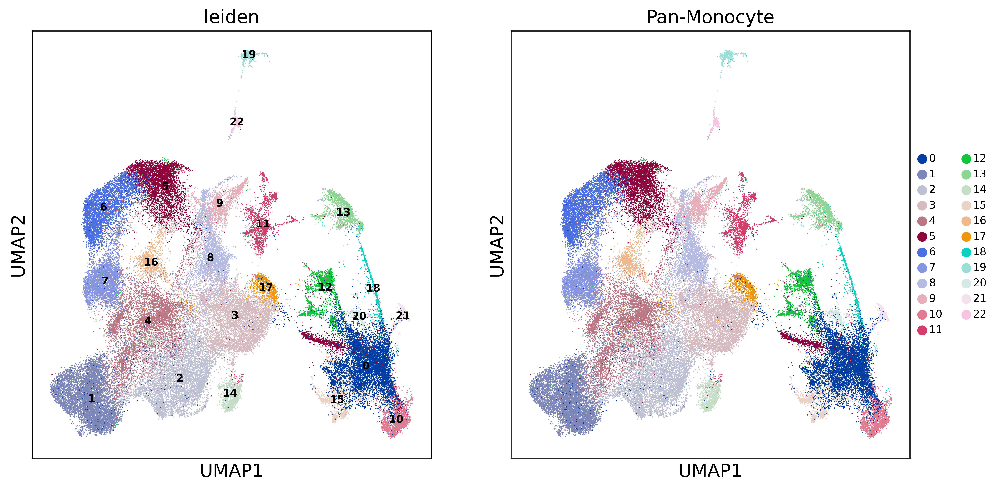

In [52]:
adata = sc.read('adata_all_monocyte_sct_annotation_latest.h5ad')

fig, axs = plt.subplots(1, 2, figsize = (12,6), dpi = 300)
sc.pl.umap(adata, color = 'leiden', size = 3, legend_loc = 'on data', legend_fontsize = 'xx-small', ax=axs[0], show=False)
sc.pl.umap(adata, color = 'leiden', size = 3, legend_fontsize = 'xx-small', title = 'Pan-Monocyte',
           ax=axs[1], show=False)

plt.savefig('figures/mono_umap.pdf')

In [53]:
adata = sc.read('adata_all_monocyte_sct_annotation_latest.h5ad')
adata.shape[0]

62261

In [55]:
adata.obs['anno'].value_counts()

TAM_PTPRF high                 7250
TAM_FN1 high                   7172
TAM_GPNMB high                 6622
TAM_CD163 high                 6513
TAM_PLAUR high                 5648
MT high TAM                    4797
TAM_PELI1 high                 4203
TAM_MDM2 high                  3314
TAM_PREX1 high                 3288
TAM_XYLT1 high                 1494
TAM_PTPRN2 high                1489
TAM_CD247 high                 1459
ECM high TAM                   1427
Cell cycle TAM_CIT high        1404
TAM_ABR high                   1270
TAM_ANK3 high                  1112
TAM_PDE4B high                  969
TAM_RBPJ high                   692
Cell cycle TAM_C2orf48 high     512
DC                              484
TAM_WWC1 high                   453
TAM_MAGI1 high                  425
TAM_NUB1 high                   264
Name: anno, dtype: int64

In [4]:
adata = sc.read('adata_all_monocyte_sct_annotation_latest.h5ad')

sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.scale(adata)

normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


/public/home/guogjgroup/ggj/anaconda3/lib/python3.9/site-packages/scanpy/plotting/_baseplot_class.py:510: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  matplotlib.colorbar.ColorbarBase(


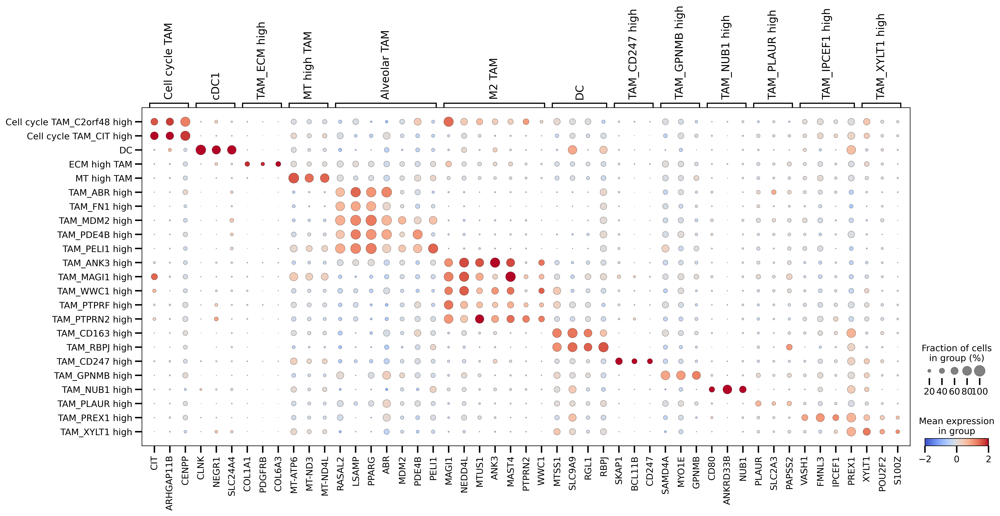

In [20]:
adata.obs['anno'] = adata.obs['anno'].astype('category')

adata.obs['anno'] = adata.obs['anno'].cat.reorder_categories(['Cell cycle TAM_C2orf48 high',
 'Cell cycle TAM_CIT high',
 'DC',
 'ECM high TAM',
 'MT high TAM',
 'TAM_ABR high',
 'TAM_FN1 high',
 'TAM_MDM2 high',
 'TAM_PDE4B high',
 'TAM_PELI1 high',
 'TAM_ANK3 high',
 'TAM_MAGI1 high',
 'TAM_WWC1 high',                                                             
 'TAM_PTPRF high',
 'TAM_PTPRN2 high',                                                          
 'TAM_CD163 high',
 'TAM_RBPJ high',                                                             
 'TAM_CD247 high',
 'TAM_GPNMB high',
 'TAM_NUB1 high',                                                            
 'TAM_PLAUR high',
 'TAM_PREX1 high',
 'TAM_XYLT1 high'])

sc.pl.dotplot(adata, marker_dict, groupby = 'anno', use_raw = False, 
              vmin=-2, vmax=2, cmap = 'coolwarm', save='_mono.pdf')